# Internal Noise — Mid-Layer Activation Visualization

Analyze intermediate convolutional layer activations under different noise (STD) conditions. Computes the percentage of inactive neurons per layer to quantify how internal noise affects internal representations.


## 1. Imports


In [28]:
# import cv2 as cv
import os
#create metadata.csv file for model training.
import csv
import pandas as pd
import numpy as np
import gc

import keras
import keras.utils as image
import matplotlib.pyplot as plt
import tensorflow as tf
import seaborn as sns

from keras.models import Sequential, Model
from keras.layers import Dense, Dropout, Flatten
from keras.layers import Conv2D, MaxPooling2D
from keras.layers import BatchNormalization
from keras.layers import Conv2D, MaxPooling2D, Dropout, Flatten, Dense, BatchNormalization, GaussianNoise, Layer
from keras.optimizers import Adam
from keras import Input
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from tqdm import tqdm
from tensorflow.keras.utils import load_img, img_to_array


import scipy.spatial as sp, scipy.cluster.hierarchy as hc
import matplotlib.pyplot as plt



## 2. Model and Training Functions


In [20]:
df = pd.read_csv("images_data.csv")
train_accuracies_dict = {}
train_accuracies = {}

train_loss_dict = {}
train_losses = {}

val_losses = {}
val_losses_dict = {}
val_accuracies = {}
val_accuracies_dict = {}
trained_Model = {}

# Define the custom activation function
def custom_relu(x, slope_positive):
    return tf.where(x > 0, slope_positive * x, tf.zeros_like(x))

# Create a custom Keras layer for the activation function
class CustomReLU(Layer):
    def __init__(self, slope_positive, **kwargs):
        super(CustomReLU, self).__init__(**kwargs)
        self.slope_positive = slope_positive

    def call(self, inputs):
        return custom_relu(inputs, self.slope_positive)

def model_test_STD(size, slope, n_epochs, filter_size, STD, Is_model_display="auto"):
    global trained_Model
    
    person_names_path = "training_data/10_images_celebrities/croped_img"
    X_dataset = []
    pad_value = 1
    SIZE = size
    SLOPE = slope
    #import all img as array into X
    for i in os.listdir(person_names_path): # i = person_name
        person_folder = os.path.join(person_names_path, i)
        if i == ".DS_Store":
            continue
        # Iterate over each image file in the person's folder
        for img_file in os.listdir(person_folder):
            img = image.load_img(os.path.join(person_folder,img_file),target_size=(SIZE,SIZE))
            img = image.img_to_array(img)
            img = img / 255
            img = np.pad(img, ((1, 1), (1, 1), (0, 0)), mode='constant', constant_values=pad_value)
            X_dataset.append(img)

    X = np.array(X_dataset)
    Y = np.array(df.drop(['img_id'], axis=1))

    X_train = []
    Y_train = []
    X_test = []
    Y_test = []

    for i in range(len(X)):
        if i % 5 == 0:  # Select every first element for the test set
            X_test.append(X[i])
            Y_test.append(Y[i])
        else:
            X_train.append(X[i])
            Y_train.append(Y[i])

    # Convert lists back to numpy arrays
    X_train = np.array(X_train)
    Y_train = np.array(Y_train)
    X_test = np.array(X_test)
    Y_test = np.array(Y_test)
    SIZE += pad_value * 2
    
    model = Sequential([])

    model.add(Conv2D(filters=filter_size, kernel_size=(5, 5), input_shape=(SIZE, SIZE, 3), padding="same", name='conv_block1_conv'))
    model.add(CustomReLU(SLOPE))
    model.add(BatchNormalization())
    model.add(MaxPooling2D(pool_size=(2, 2)))
    model.add(Dropout(0.2))
    model.add(GaussianNoise(stddev=STD, input_shape=(SIZE, SIZE, 3), name='conv_block1_gsn'))

    filter_size *= 2
    model.add(Conv2D(filters=filter_size, kernel_size=(5, 5), name='conv_block2_conv'))
    model.add(CustomReLU(SLOPE))
    model.add(MaxPooling2D(pool_size=(2, 2)))
    model.add(BatchNormalization())
    model.add(Dropout(0.2))
    model.add(GaussianNoise(stddev=STD, input_shape=(SIZE, SIZE, 3),name='conv_block2_gsn'))

    filter_size *= 2
    model.add(Conv2D(filters=filter_size, kernel_size=(5, 5), name='conv_block3_conv'))
    model.add(CustomReLU(SLOPE))
    model.add(MaxPooling2D(pool_size=(2, 2)))
    model.add(BatchNormalization())
    model.add(Dropout(0.2))
    model.add(GaussianNoise(stddev=STD, input_shape=(SIZE, SIZE, 3),name='conv_block3_gsn'))
    
    model.add(Flatten())
    model.add(Dense(128, activation='relu'))
    model.add(Dropout(0.5))
    model.add(Dense(64, activation='relu', name=f'least2_Dense_{STD}'))
    model.add(Dropout(0.5))
    model.add(Dense(10, activation='softmax'))

    model.summary()
    trained_Model[STD] = model

    model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

    history = model.fit(X_train, Y_train, epochs=n_epochs, validation_data=(X_test, Y_test), batch_size=64, verbose=Is_model_display)

    # Save the metrics for this input size
    train_losses[STD] = history.history['loss']
    val_losses[STD] = history.history['val_loss']
    train_accuracies[STD] = history.history['accuracy']
    val_accuracies[STD] = history.history['val_accuracy']

def plot_metrics_acc(metrics_dict, epochs_num, title, ylabel, fs):
    plt.figure(figsize=(30, 15))
    step = int(epochs_num / 10)
    error_bar_positions = np.arange(step, epochs_num + 1, step)
    colors = ['b', 'g', 'r', 'c', 'm', 'y', 'k', 'orange', 'purple', 'brown']
    color_index = 0
    for std_dev, m_list in metrics_dict.items():
        arr = np.array(m_list).T
        m_means = arr.mean(axis=1)
        m_stds = arr.std(axis=1)
        current_color = colors[color_index % len(colors)]
        
        plt.plot(range(len(arr)), m_means, label=f'STD {std_dev}', color=current_color)
        for i in error_bar_positions:
            if i == 0:
                continue
            plt.errorbar(i, m_means[i-1], yerr=m_stds[i-1], fmt='.', capsize=5, color=current_color)
        color_index += 1

    title = title + " filter_size = " + str(fs)

    plt.title(title)
    plt.xlabel('Epochs')
    plt.ylabel(ylabel)
    plt.legend()
    plt.grid(True)
    plt.show()

def loop_STD(num, input_size, STD_array, ep, fs, Is_model_display=1):
    train_accuracies_dict.clear()
    train_accuracies.clear()

    train_loss_dict.clear()
    train_losses.clear()

    val_accuracies.clear()
    val_accuracies_dict.clear()

    val_losses.clear()
    val_losses_dict.clear()

    for iteration in range(num):
        for std_dev in STD_array:
            print("STD = ", std_dev)
            model_test_STD(input_size, slope=0.05, n_epochs=ep, filter_size=fs, STD=std_dev, Is_model_display=Is_model_display)

            if std_dev not in train_accuracies_dict:
                train_accuracies_dict[std_dev] = []

            if std_dev not in train_loss_dict:
                train_loss_dict[std_dev] = []

            if std_dev not in val_losses_dict:
                val_losses_dict[std_dev] = []

            if std_dev not in val_accuracies_dict:
                val_accuracies_dict[std_dev] = []
                
            train_loss_dict[std_dev].append(train_losses[std_dev])
            train_accuracies_dict[std_dev].append(train_accuracies[std_dev])

            val_losses_dict[std_dev].append(val_losses[std_dev])
            val_accuracies_dict[std_dev].append(val_accuracies[std_dev])

    plot_metrics_acc(train_loss_dict, ep, 'Training Losses for Different STD', 'Losses', fs)
    plot_metrics_acc(train_accuracies_dict, ep, 'Training Accuracy for Different STD', 'Accuracy', fs)
    plot_metrics_acc(val_losses_dict, ep, 'Validation Losses for Different STD', 'Losses', fs)
    plot_metrics_acc(val_accuracies_dict, ep, 'Validation Accuracy for Different STD', 'Accuracy', fs)


      
   

## 3. Single-Run Pilot

Train one model per noise level to verify the pipeline.


STD =  0
Model: "sequential_10"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv_block1_conv (Conv2D)   (None, 202, 202, 16)      1216      
                                                                 
 custom_re_lu_29 (CustomReLU  (None, 202, 202, 16)     0         
 )                                                               
                                                                 
 batch_normalization_29 (Bat  (None, 202, 202, 16)     64        
 chNormalization)                                                
                                                                 
 max_pooling2d_29 (MaxPoolin  (None, 101, 101, 16)     0         
 g2D)                                                            
                                                                 
 dropout_47 (Dropout)        (None, 101, 101, 16)      0         
                                            

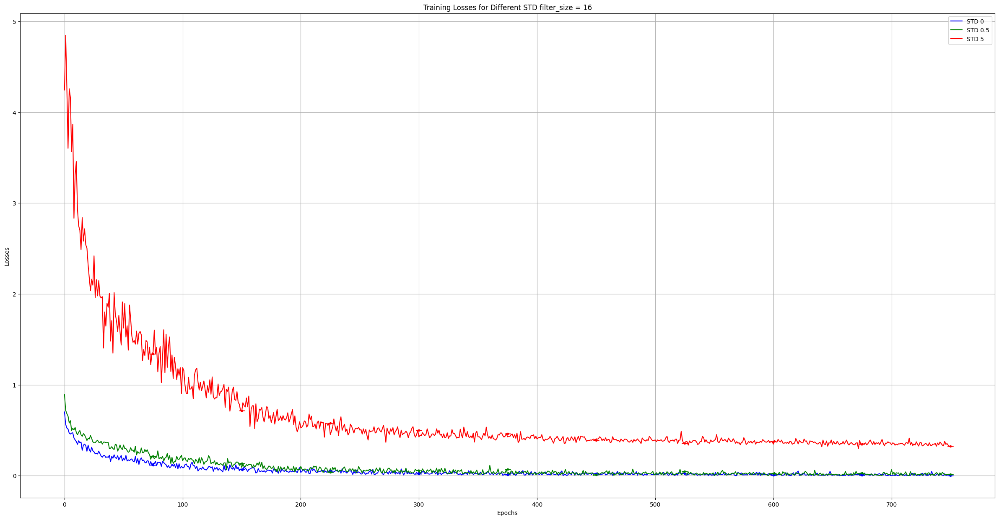

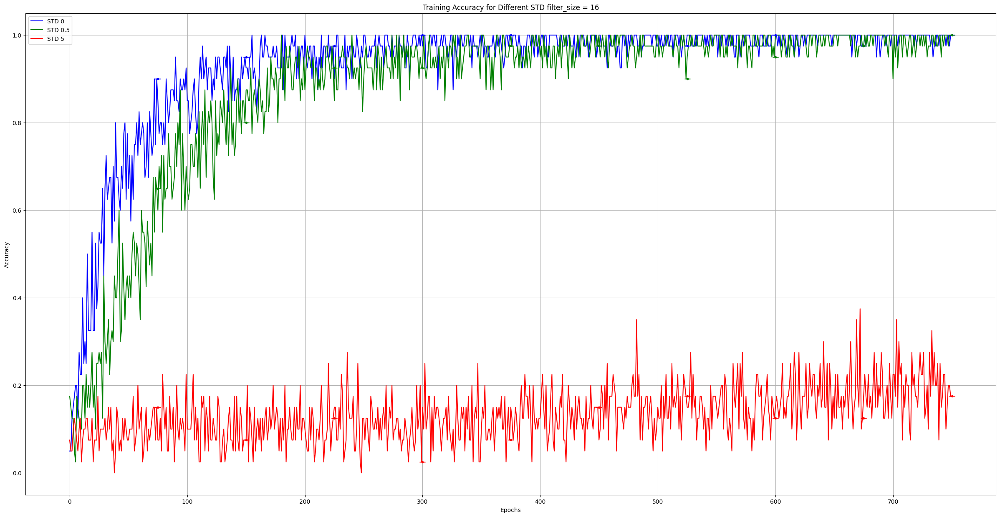

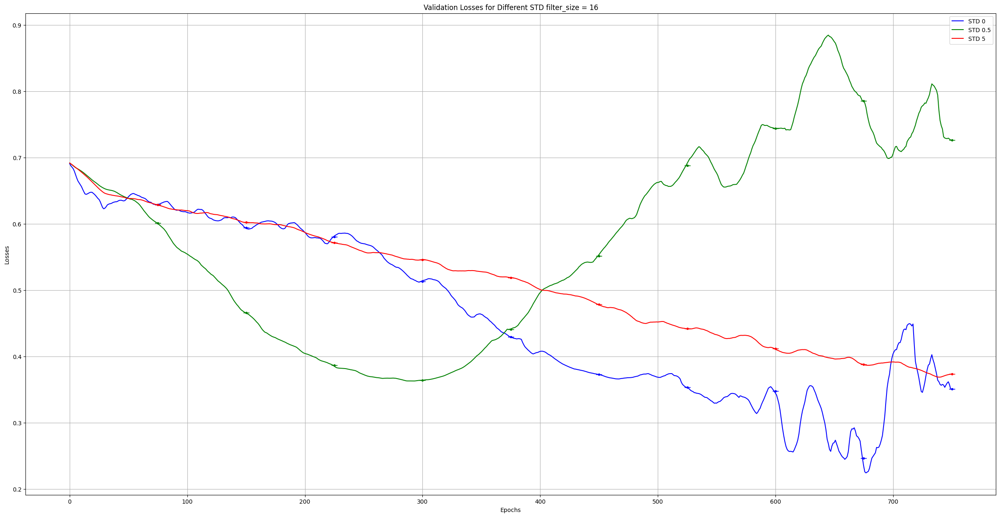

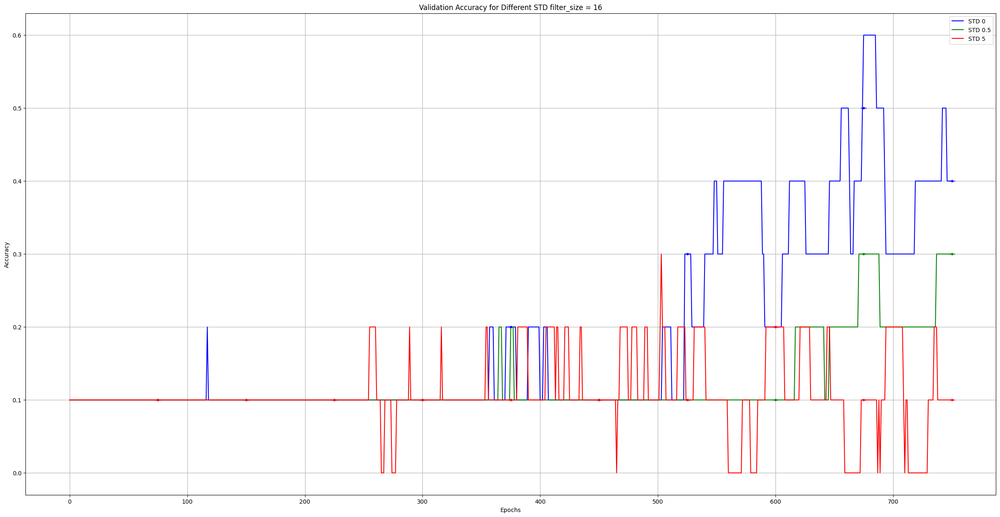

In [21]:
loop_STD(num=1, input_size=200, STD_array=[0, 0.5, 5], ep=750, fs=16, Is_model_display=0)

## 4. Activation Extraction Functions

Define functions to extract layer activations and visualize activation maps.


In [15]:
def get_layer_outputs(model, layer_names, img):
    """
    Extract activations from the specified layers for a given model and input image.
    
    Parameters:
    - model: The trained model from which activations are to be extracted.
    - layer_names: A list of layer names from which to extract activations.
    - img: The input image.
    
    Returns:
    - A list of activations corresponding to the specified layers.
    """
    outputs = [model.get_layer(name).output for name in layer_names]
    activation_model = Model(inputs=model.input, outputs=outputs)
    
    activations = activation_model.predict(img)
    return activations

def visualize_activations_by_STD_in_full_row(model_dict, layer_names, img):
    """
    Visualize activations of models with different standard deviations (STD), displaying all filters
    of one model in one row, and the other model's filters in the next row. Handles layers with
    different numbers of filters.
    
    Parameters:
    - model_dict: Dictionary with STD values as keys and trained models as values.
    - layer_names: List of layer names to visualize activations from.
    - img: The input image.
    """
    # Sort STDs in ascending order
    sorted_STDs = sorted(model_dict.keys())
    
    # Extract activations for all models and store them
    all_activations = []
    for std_dev in sorted_STDs:
        model = model_dict[std_dev]
        activations = get_layer_outputs(model, layer_names, img)
        all_activations.append((std_dev, activations))
    
    # Visualize the activations in full row per model for each layer
    for layer_name in layer_names:
        print(f"Visualizing layer: {layer_name}")
        
        num_filters = all_activations[0][1][layer_names.index(layer_name)].shape[-1]  # Number of filters for the current layer
        n_cols = num_filters  # Set the number of columns to be equal to the number of filters
        
        total_rows = len(sorted_STDs)  # One row per model
        
        # Create subplots for all model activations (each model in its own row)
        fig, axes = plt.subplots(total_rows, n_cols, figsize=(n_cols * 2, total_rows * 2))
        
        # If there's only one row, ensure axes are 2D
        if total_rows == 1:
            axes = np.expand_dims(axes, axis=0)
        if n_cols == 1:
            axes = np.expand_dims(axes, axis=1)
        
        # Iterate over each model and visualize its activations in one row
        for model_idx, (std_dev, activations) in enumerate(all_activations):
            layer_activation = activations[layer_names.index(layer_name)]
            
            for i in range(num_filters):
                ax = axes[model_idx, i]  # Accessing the correct subplot
                
                activation = layer_activation[0, :, :, i]
                
                # Normalize the activation for visualization
                activation -= activation.mean()
                activation /= (activation.std() + 1e-5)
                activation *= 64
                activation += 128
                activation = np.clip(activation, 0, 255).astype('uint8')
                
                # Display the activation
                ax.imshow(activation, cmap='viridis')
                ax.axis('off')
                if i == 0:  # Add a title to the first filter of each model
                    ax.set_title(f"STD: {std_dev}", fontsize=10)
        
        plt.tight_layout()
        plt.show()



## 5. Single-Image Activation Maps

Visualize the activation patterns for a single example image across all noise conditions.


1/1 [==============================] - 0s 73ms/step
Visualizing layer: conv_block1_conv


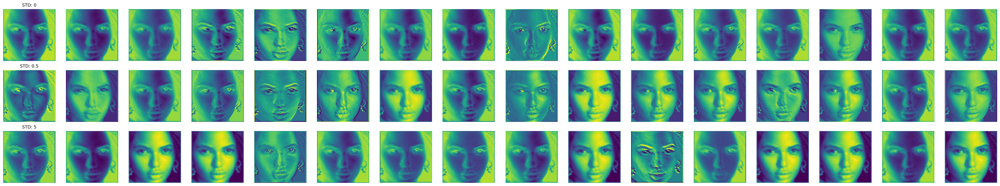

Visualizing layer: conv_block1_gsn


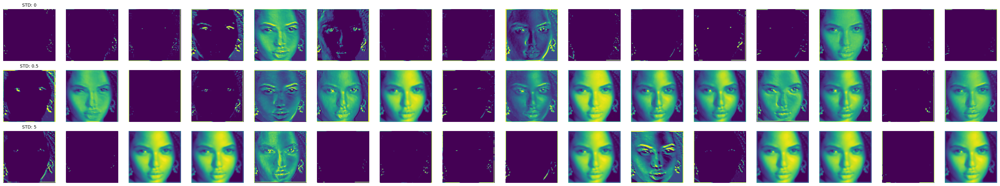

Visualizing layer: conv_block2_conv


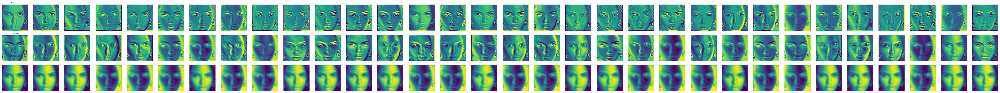

Visualizing layer: conv_block2_gsn


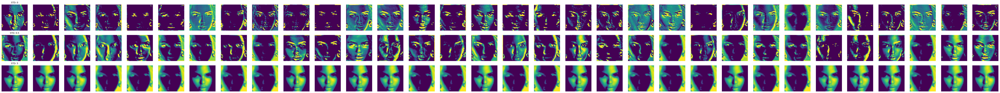

Visualizing layer: conv_block3_conv


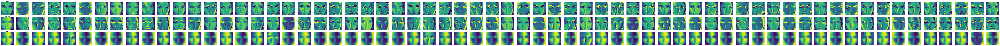

Visualizing layer: conv_block3_gsn


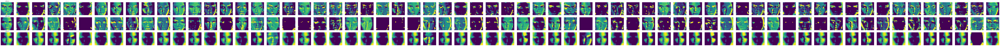

In [22]:
SIZE = 200
pad_value = 1

single_image_path = 'training_data/10_images_celebrities/croped_img/juliana/juliana_0.png'
single_img = image.load_img(single_image_path, target_size=(SIZE, SIZE))
single_img = image.img_to_array(single_img)
single_img = single_img / 255.0
single_img = np.pad(single_img, ((pad_value, pad_value), (pad_value, pad_value), (0, 0)), mode='constant', constant_values=pad_value)
single_img = np.expand_dims(single_img, axis=0)

# Specify the layer names
layer_names_to_visualize = [
    'conv_block1_conv', 'conv_block1_gsn',
    'conv_block2_conv', 'conv_block2_gsn',
    'conv_block3_conv', 'conv_block3_gsn'
]

visualize_activations_by_STD_in_full_row(trained_Model, layer_names_to_visualize, single_img)

## 6. Full 20-Run Training with Inactive Neuron Logging


In [33]:
df = pd.read_csv("images_data.csv")

def calculate_inactive_neurons(activation, threshold=1e-3):
    """
    Calculate the percentage of inactive neurons in a layer's activation.

    Parameters:
    - activation: The activation output of a layer.
    - threshold: The value below which a neuron is considered inactive (default is 1e-3).

    Returns:
    - The percentage of inactive neurons.
    """
    # Flatten the activation to count the total number of neurons
    total_neurons = np.prod(activation.shape)
    
    # Count the number of neurons below the threshold (inactive)
    inactive_neurons = np.sum(np.abs(activation) < threshold)
    
    # Calculate the percentage of inactive neurons
    inactive_percentage = (inactive_neurons / total_neurons) * 100
    return inactive_percentage

def analyze_inactive_neurons_single_image(activation_model, layer_names, img):
    """
    Analyze the percentage of inactive neurons in the specified layers for the given activation model and image.

    Parameters:
    - activation_model: Model used for extracting activations of specified layers.
    - layer_names: A list of layer names to analyze for inactive neurons.
    - img: The single input image to use for analysis.

    Returns:
    - A dictionary containing the percentage of inactive neurons for each specified layer.
    """
    # Predict activations for the specified layers
    activations = activation_model.predict(img)

    # Calculate and store inactive neuron percentages for each layer
    inactive_neurons_dict = {}
    for i, layer_name in enumerate(layer_names):
        inactive_percentage = calculate_inactive_neurons(activations[i])
        inactive_neurons_dict[layer_name] = inactive_percentage

    return inactive_neurons_dict

def model_test_gsn(size, std, n_epochs, filter_size, Is_model_display, X, Y):
    slope = 0.05
    pad_value = 1
    g = std
    SIZE = size + pad_value * 2  # Adjusted for padding

    # Prepare data for training and testing
    X_train_list, Y_train_list, X_test_list, Y_test_list = [], [], [], []
    for i in range(len(X)):
        if i % 5 == 0:
            X_test_list.append(X[i])
            Y_test_list.append(Y[i])
        else:
            X_train_list.append(X[i])
            Y_train_list.append(Y[i])

    X_train_full = np.array(X_train_list)
    Y_train_full = np.array(Y_train_list)
    X_test_full = np.array(X_test_list)
    Y_test_full = np.array(Y_test_list)

    model = Sequential()

    # Model architecture
    model.add(Conv2D(filters=filter_size, kernel_size=(5, 5), input_shape=(SIZE, SIZE, 3),
                     padding="same", name='conv_block1_conv'))
    model.add(CustomReLU(slope, name='conv_block1_relu'))
    model.add(BatchNormalization())
    model.add(MaxPooling2D(pool_size=(2, 2)))
    model.add(Dropout(0.2))
    model.add(GaussianNoise(stddev=g))

    filter_size *= 2
    model.add(Conv2D(filters=filter_size, kernel_size=(5, 5), name='conv_block2_conv'))
    model.add(CustomReLU(slope, name='conv_block2_relu'))
    model.add(BatchNormalization())
    model.add(MaxPooling2D(pool_size=(2, 2)))
    model.add(Dropout(0.2))
    model.add(GaussianNoise(stddev=g))

    filter_size *= 2
    model.add(Conv2D(filters=filter_size, kernel_size=(5, 5), name='conv_block3_conv'))
    model.add(CustomReLU(slope, name='conv_block3_relu'))
    model.add(BatchNormalization())
    model.add(MaxPooling2D(pool_size=(2, 2)))
    model.add(Dropout(0.2))
    model.add(GaussianNoise(stddev=g))

    model.add(Flatten())
    model.add(Dense(128, activation='relu'))
    model.add(Dropout(0.5))
    model.add(Dense(64, activation='relu'))
    model.add(Dropout(0.5))
    model.add(Dense(10, activation='softmax'))

    model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

    # Prepare to store results of inactive neurons
    layer_names = ['conv_block1_relu', 'conv_block2_relu', 'conv_block3_relu']
    inactive_results = {g: {layer: None for layer in layer_names}}

    # Create the activation model once
    outputs = [model.get_layer(name).output for name in layer_names]
    activation_model = Model(inputs=model.input, outputs=outputs)

    # Train the model for the total number of epochs
    history = model.fit(X_train_full, Y_train_full, epochs=n_epochs, validation_data=(X_test_full, Y_test_full),
                        batch_size=64, verbose=Is_model_display)

    # Analyze inactive neurons using a sample image
    single_img = np.expand_dims(X_test_full[0], axis=0)  # Use one sample from test data for analysis
    inactive_percentages = analyze_inactive_neurons_single_image(activation_model, layer_names, single_img)
    for layer_name, inactive_percentage in inactive_percentages.items():
        inactive_results[g][layer_name] = inactive_percentage

    # Delete model and free memory
    del model
    del activation_model
    gc.collect()

    return inactive_results

def loop_STD(num, input_size, std_arr, ep, fs, Is_model_display=1):
    # Load data once outside the loops
    person_names_path = "training_data/10_images_celebrities/croped_img"
    X_dataset = []
    pad_value = 1
    SIZE = input_size

    print("Loading data...")
    # Import all images as array into X
    for i in os.listdir(person_names_path):  # i = person_name
        person_folder = os.path.join(person_names_path, i)
        if i == ".DS_Store":
            continue
        for img_file in os.listdir(person_folder):
            img_path = os.path.join(person_folder, img_file)
            img = image.load_img(img_path, target_size=(SIZE, SIZE))
            img = image.img_to_array(img)
            img = img / 255.0
            img = np.pad(img, ((pad_value, pad_value), (pad_value, pad_value), (0, 0)),
                         mode='constant', constant_values=pad_value)
            X_dataset.append(img)

    X = np.array(X_dataset)
    Y = np.array(df.drop(['img_id'], axis=1))

    # Check if CSV file exists; if not, write headers
    csv_file = "GSN_inactive_neurons_results.csv"
    if not os.path.exists(csv_file):
        with open(csv_file, mode='w', newline='') as file:
            writer = csv.writer(file)
            writer.writerow(['Iteration', 'STD', 'Layer', 'Inactive_Percentage'])

    for iteration in range(num):
        print(f"Iteration {iteration + 1} of {num}")

        for g in std_arr:
            print(f"Std = {g}")

            # Train the model for the current slope
            inactive_results = model_test_gsn(input_size, g, ep, fs, Is_model_display, X, Y)

            # Record and write results to CSV file
            for g, layer_results in inactive_results.items():
                for layer_name, percentage in layer_results.items():
                    # Write results to CSV file after each model
                    with open(csv_file, mode='a', newline='') as file:
                        writer = csv.writer(file)
                        writer.writerow([iteration, g, layer_name, percentage])

    print(f"Results saved to {csv_file}")



In [34]:
# Define your parameters

# Run the loop
loop_STD(num=20, input_size=200, std_arr=[0, 0.5, 5], ep=750, fs=16, Is_model_display=0)


Loading data...
Iteration 1 of 20
Std = 0
1/1 [==============================] - 0s 62ms/step
Std = 0.5
1/1 [==============================] - 0s 62ms/step
Std = 5
1/1 [==============================] - 0s 64ms/step
Iteration 2 of 20
Std = 0
1/1 [==============================] - 0s 62ms/step
Std = 0.5
1/1 [==============================] - 0s 64ms/step
Std = 5
1/1 [==============================] - 0s 62ms/step
Iteration 3 of 20
Std = 0
1/1 [==============================] - 0s 62ms/step
Std = 0.5
1/1 [==============================] - 0s 62ms/step
Std = 5
1/1 [==============================] - 0s 61ms/step
Iteration 4 of 20
Std = 0
1/1 [==============================] - 0s 62ms/step
Std = 0.5
1/1 [==============================] - 0s 63ms/step
Std = 5
1/1 [==============================] - 0s 64ms/step
Iteration 5 of 20
Std = 0
1/1 [==============================] - 0s 62ms/step
Std = 0.5
1/1 [==============================] - 0s 62ms/step
Std = 5
1/1 [==============================]

## 7. Aggregate Results

Load the CSV of inactive neuron percentages and compute summary statistics by noise level and layer.


Layer  conv_block1_relu  conv_block2_relu  conv_block3_relu
STD                                                        
0.0           76.080539         74.063878         70.796383
0.5           47.600342         48.753986         49.170406
5.0           63.180517         55.728491         55.092370


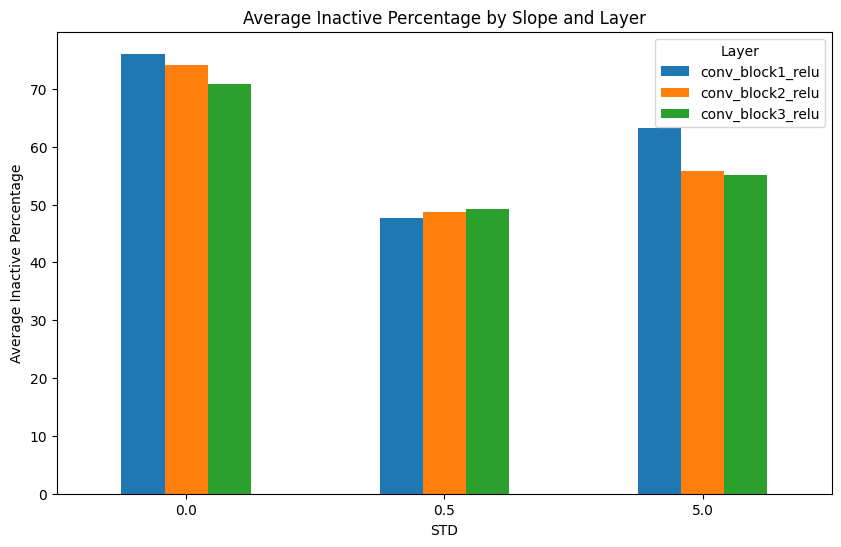

In [35]:
# Read the CSV file
df = pd.read_csv('GSN_inactive_neurons_results.csv')

# Group by Slope and Layer, compute mean of Inactive_Percentage
grouped = df.groupby(['STD', 'Layer'])['Inactive_Percentage'].mean().reset_index()

# Pivot the table for better visualization
pivot_table = grouped.pivot(index='STD', columns='Layer', values='Inactive_Percentage')

# Print the pivot table
print(pivot_table)

# Plot the results
pivot_table.reset_index(inplace=True)
pivot_table.plot(x='STD', kind='bar', figsize=(10,6))
plt.title('Average Inactive Percentage by Slope and Layer')
plt.xlabel('STD')
plt.ylabel('Average Inactive Percentage')
plt.xticks(rotation=0)
plt.legend(title='Layer')
plt.show()